In [2]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


## Food Classification Using Efficientnet model by transferlearning

1.Problem Statement
> How well can we predict from this huge Food dataset, can it predict the 101 classes for different kind of food ?

2.Data
> The Food101 came from tensorflow Datasets, which is ready to use in "tensors" form. But the original it's from : Food-101 – Mining Discriminative Components with Random Forests paper and their respected authors {Bossard, Lukas and Guillaumin, Matthieu and Van Gool, Luc} src:https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/

3.Evaluation
> if this model can reach accuracy above 90% of food classification form the 101 classes, then this project will pursue its improvements.


4.Features
> This dataset consists of 101 food categories, with 101'000 images. For each class, 250 manually reviewed test images are provided as well as 750 training images. On purpose, the training images were not cleaned, and thus still contain some amount of noise. This comes mostly in the form of intense colors and sometimes wrong labels. All images were rescaled to have a maximum side length of 512 pixels.
- images with different width, height such as: (512, 512, 3), the color channel is 3 doesn't change.
- label: contains mix of numbers(the label number in index) and the name of the label.

for further info:https://www.tensorflow.org/datasets/catalog/food101



## Check GPU Compatible for Mixed Precesion training
> Mixed Precesion training: mix of float32 + float16 data types and the benefit from this way is the fast training of the model. Also it's something new for Tensorflow 2.4.

Compatible GPUs that google colab offer is:
- Tesla T4 (Compute > 7+)


In [1]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-41c835cd-5697-4e3f-cab2-6a0d763739e8)


After Checking it's the right GPU for this approach, we're ready to go!.

## Downloading the dataset for tensorflow datasets TFDS
Our Dataset will be `Food101` from tensorflow, 
Source: https://www.tensorflow.org/datasets/catalog/food101

we'll import it by using `tensorflow_datasets`

In [3]:
# importing the dataset 
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from tensorflow.keras import layers
from tensorflow.keras import mixed_precision
import datetime
import os

In [72]:
# Load the dataset 'food101'
(train_data, test_data), ds_meta = tfds.load(name="food101", 
                                             split=["train", "validation"],
                                             shuffle_files=True, 
                                             as_supervised=True, 
                                             with_info=True) 

will download the dataset for food101 by using `tfds.load()` function but for that will use a couple of parameters:
- name : indicates the name of dataset we want.
- split: we'll split the dataset into training & validation in our case `food101` doesn't have test set ... caution:(not all datasets have train & test & valid splitting). 
- shuffle_files: as dataset gets downloaded it'll shuffle the tensors for us.
- as_supervised: means data returned will be in format of tuple such as (data, label)
- with_info: True, means additionaly to the tensors that will be downloaded also downlaod the information for this dataset.

## EDA
Discover the dataset and gain indepth knowledge about the variables labels, what type of images ?, how many images per classes, plotting different charts to visualize the dataset in higher levels.

In [5]:
ds_meta.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=tf.uint8),
    'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=101),
})

Here we have image, label. For image we have certain shape with 3 color channel and the data type is uint8 maybe will change it later for neural network to accept.
For labels we have 101 classes.

In [6]:
# discover which class names in there.
class_names = ds_meta.features['label'].names
class_names[:5]

['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare']

### Explore what's those tensors are
See what's those tensors shape, class, datatype and such from the `train_data`

In [7]:
test_sample = train_data.take(1)
test_sample

<TakeDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

We took a single sample to that we can extract some knowledge from it later.

In [73]:
train_data.element_spec, test_data.element_spec

((TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None),
  TensorSpec(shape=(), dtype=tf.int64, name=None)),
 (TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None),
  TensorSpec(shape=(), dtype=tf.int64, name=None)))

As we can see it's formated as tuple of (image_tensors, labels).

In [9]:
for img, lbl in test_sample:
  print(f"""
  Image Shape: {img.shape}
  Class Name: {class_names[lbl.numpy()]}
  Class tensor: {lbl}
  Image Data Type: {img.dtype}
  """)


  Image Shape: (512, 512, 3)
  Class Name: cheesecake
  Class tensor: 16
  Image Data Type: <dtype: 'uint8'>
  


A quick and simple way to explore the tensors we got,
as we can see the dimension of the image are (512, 512, 3)
which are height, width, color channel respectively.
and the class tensor we can see that it's NOT one-hot encoded. maybe we'll need to use loss = sparse_categorical_crossentropy for it.

Also if we notice our images isn't the same size, so we need to reshape it to the same size. Same with dtype we need to change it to `float32` same as estimator format.

### Plotting tensorflow images using matplotlib



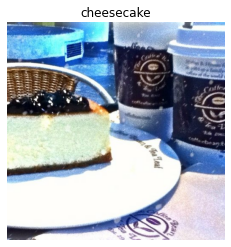

In [10]:
plt.imshow(img)
plt.title(class_names[lbl.numpy()]) 
plt.axis(False);

By using matplot we can plot that image we extracted from a single tensor.
and we preventing the axis from showing by turning `axis` to False also semicolon `;` to prevent the output axis from showing.

In [11]:
# Plotting images side by side
def show_30_imgs(imgs):
  """ Plot 30 images from data tensors """

  plt.figure(figsize=(15, 15))
  i = 0
  for img, label in imgs.take(30):
    # Create subplot of 3 rows and 5 column
    ax = plt.subplot(5, 6, i + 1)
    i = i + 1
    plt.imshow(img)
    # For each image put it's name above
    plt.title(class_names[label.numpy()])
    plt.axis(False);

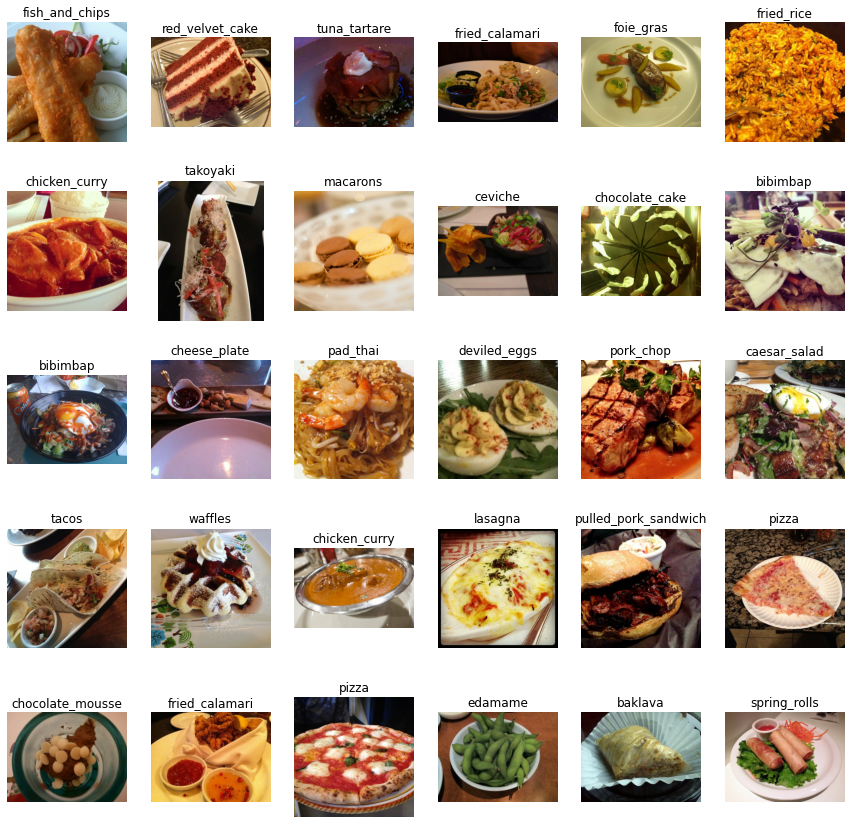

In [12]:
show_30_imgs(train_data)

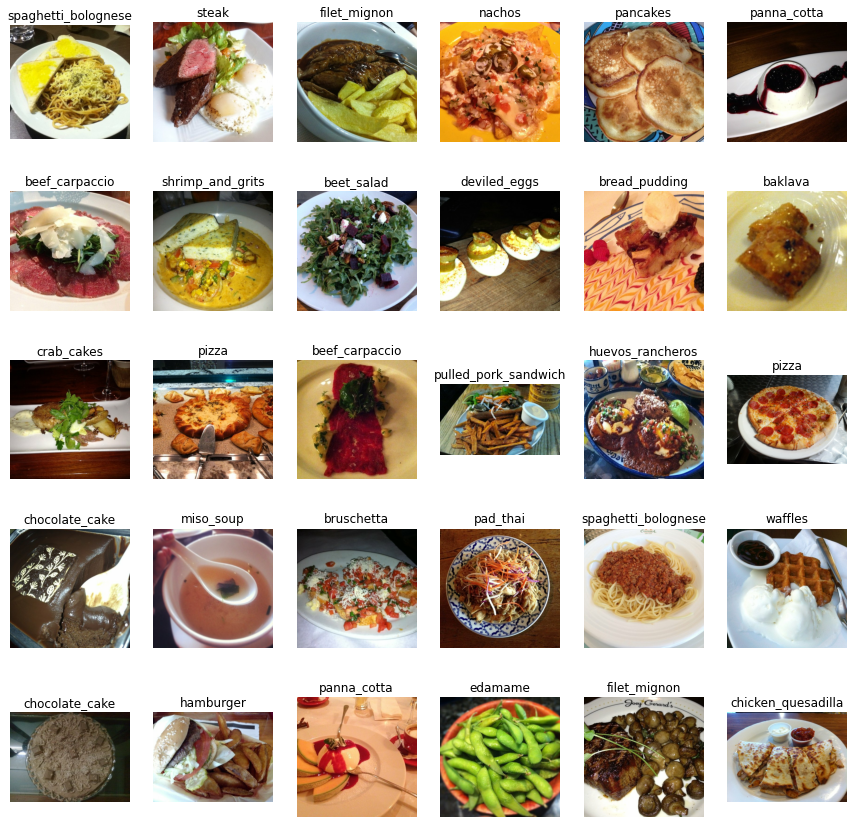

In [13]:
show_30_imgs(train_data)

After Plotting the images we can see that a couple of challenges from this dataset, such as:
- Zoom in/ Zoom out images of the food which makes it difficult to classify and raises problems.
- Pixlated images, some of the images isn't 100% clear of what's there, some foggy, unclear pictures.
- Lightness/darkness: some of the images has problem with lightness/darkness even for human eyes you'll face problem identifying the food.
- Weird angle: Some images had been taken from a weird angle which makes it a challenge to identify like the "takoyaki" one from first plot.
- Mixed food: images with another food mixed in there, that'll be even harder for the model to identify which food are labeled here ?




In [16]:
def compare_WidthHeight(data):
  num_of_squares = 0
  total_imgs = len(data)
  for num in data.as_numpy_iterator():
    if num[0].shape[0] == num[0].shape[1]:
      num_of_squares = num_of_squares + 1
  return f"Number of Sqare images: {num_of_squares} \n Total number of images: {total_imgs}\n  Numbers of Square compare to the whole: {num_of_squares / total_imgs}"

compare_WidthHeight(train_data)

'Number of Sqare images: 46688 \n Total number of images: 75750\n  Numbers of Square compare to the whole: 0.6163432343234323'

We can see that here the number of 512 x 512 images which are squares = 46688 from 75750 total images. That Represents 61% of images that has 512x512 dimension.

That's mean this dataset doesn't contain all the images in the same dimension.

In [17]:
def check_color(data):
  checked_colors = 0
  for color in data.as_numpy_iterator():
    if color[0].shape[2] == 3:
      checked_colors = checked_colors + 1
  return f"Ratio of 3 Colored Channels are: {checked_colors / len(data)}"

check_color(train_data)

'Ratio of 3 Colored Channels are: 1.0'

So For color channel it seems that all the images are 3 colored channel.
means it contain (red, green, blue) channel layers.

## Preprocessing the images
We'll write a function which process the images with
- reshaping the images.
- changing the data type of images.

In [18]:
def process_imgs(img, label, IMG_SIZE=224):
  """ 
  A Simple Function to convert the shapes of images to one standard number,
  Change the data type of images from uint8 ==> float32
  """
  images = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
  return tf.cast(images, tf.float32), label

This function returns preprocessed images as tuple of (imgs, labels).

### Test the image processing Function 
to see whether it's working or not.

In [19]:
# Test the sample we made previously with this function
pre_processed_img = process_imgs(img, lbl)[0]

print(f"Image before processing:\n {img}  \n The Shape of img: {img.shape}")
print(f"Image After processing:\n {pre_processed_img}  \n The Shape of img: {pre_processed_img.shape}")

Image before processing:
 [[[ 85  84  92]
  [ 86  85  93]
  [ 93  92 100]
  ...
  [120 196 245]
  [120 198 246]
  [121 199 247]]

 [[ 88  88  96]
  [ 82  82  90]
  [ 88  88  96]
  ...
  [116 192 244]
  [118 195 249]
  [119 196 248]]

 [[ 77  80  89]
  [ 75  78  87]
  [ 82  86  95]
  ...
  [115 189 252]
  [117 192 255]
  [118 194 255]]

 ...

 [[159 166 194]
  [154 161 187]
  [171 178 204]
  ...
  [219 216 235]
  [223 220 239]
  [227 226 244]]

 [[170 179 208]
  [169 179 206]
  [173 183 210]
  ...
  [218 217 235]
  [223 222 240]
  [226 227 245]]

 [[168 177 206]
  [170 179 208]
  [152 162 189]
  ...
  [224 223 241]
  [228 229 247]
  [231 232 250]]]  
 The Shape of img: (512, 512, 3)
Image After processing:
 [[[ 84.67857   84.321434  92.321434]
  [ 87.19898   86.841835  94.841835]
  [ 84.72959   84.581635  94.72449 ]
  ...
  [119.50503  194.93877  245.85202 ]
  [114.974525 190.97452  241.90309 ]
  [119.071465 196.4286   247.82652 ]]

 [[ 75.647964  84.21939   93.21939 ]
  [ 71.45407   80

## Batch And prepare the datasets for Training
Before putting our data into a machine learning model, we need first to batch it.
Why ? because it's more memory efficient so that GPUs can fit the data inside the memory.



In [76]:
# Process & Batch the images in parallel for training set
train_ds = train_data.map(map_func=process_imgs, num_parallel_calls=tf.data.AUTOTUNE)

# Batch the data and shuffle it again
train_ds = train_data.shuffle(1000).batch(32).prefetch(buffer_size=tf.data.AUTOTUNE)


# Process & Batch the images in parallel for test set.
test_ds = test_data.map(map_func=process_imgs, num_parallel_calls=tf.data.AUTOTUNE).batch(32).prefetch(buffer_size=tf.data.AUTOTUNE)

We're mapping the training data to the map function which runs `process_imgs` we wrote earlier, and `tf.data.AUTOTUNE` means utilize all the compute power (processes) to process that data.

We shuffled the data again to make sure that Neural network doesn't know any number.

For Shuffling we shuffle it 1000 times data each time.

`prefecth` preparse subsequent of batch while the other keeps computing in the background but, for the cost of memory. in return fasten the process of load dataset.

In [78]:
len(train_ds), len(test_ds)

(2368, 790)

In [77]:
len(train_data), len(test_data)

(75750, 25250)

### Creating a callback
Creating an earlystopping to prevent our model from overfitting. It works by stopping the model after no improvement seen. 

we'll make it stops after 3 rounds of no improvement. That's `patience` parameter

In [35]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

In [23]:
%load_ext tensorboard

### Creating a Tensorboard to monitor model performance.

In [24]:
# Create Tensorboard to monitor our model performance
def create_tensorboard():
  # Create a path to store tensorboard logs
  logdir = os.path.join("/content/drive/MyDrive/notebooks", 
                        # Set log name format of Year-month-day Hour-Minute-Second
                        datetime.datetime.now().strftime("%Y-%m-%d %H-%M-%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Activate mixed precesion training

In [25]:
# Activate Mixed Precesion training
mixed_precision.set_global_policy(policy="mixed_float16")

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: Tesla T4, compute capability 7.5


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: Tesla T4, compute capability 7.5


As Mentioned Above Mixed precesion will speed up our training speed for models by nearly 3X folds. But it needs GPUs who support compute capabilities of 7+ score

In [26]:
mixed_precision.global_policy()

<Policy "mixed_float16">

Check to make sure it's changed to mixed_float16. to start building the model and start training.

## Builiding the Features extraction model
By using Efficientnetb0 we're gonna freeze all the layers and put our own layers.

In [42]:
# Create the Efficientnet model 
INPUT_SHAPE = (224, 224, 3)
eff_model = tf.keras.applications.EfficientNetB0(include_top=False)
eff_model.trainable = False 

# Creating the pipeline for our EFFICIENTNET
inputs = layers.Input(shape=INPUT_SHAPE, name="input_layer", dtype=tf.float16)

# Freeze the baseline model because we don't want to use their weights
x = eff_model(inputs, training=False) 
x = layers.GlobalAveragePooling2D(name="pooling_layer")(x)
# Creating the output neurons for each class = 101 = neurons
x = layers.Dense(len(class_names))(x) 

# Change output for numerical stability to float32
output = layers.Activation("softmax", name="classes_softmax_float32", dtype=tf.float32)(x)
model = tf.keras.Model(inputs, output)


# Compile the model
model.compile(loss="sparse_categorical_crossentropy", 
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

For Building the Machine learning pipeline here we made a couple of steps to tune it for mixed precesion which are:
- Creating the EFFICIENTNETB0 model for training, this model trained on imagenet weights. but we don't want those weights we want ours to learn patterns as such so we froze those layers, Maybe later i'll fine-tune the model.
- for `inputs` we made it to the shapes we specified and also for dtype=float16 for mixed precesion.
- Then creating the max-pooling layer for our inputs and then classify it in the last layer which is length of `class_names` the 100 class but, for that layer we'll change it's data type to float32 for numerical stability as Tensorflow suggested for "Mixed precesion" processses.
- Then build the model from those `inputs` `output` we specified it's settings, then compile it using `sparse categorical crossentropy` that's used for classes that isn't one-hot encoded rather bunch of integers numbers. for optimizer i used the Adam(), and for metrics "accuracy" because to see is it accurate for classifying the food images ?


source: https://www.tensorflow.org/guide/mixed_precision

In [43]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 pooling_layer (GlobalAverag  (None, 1280)             0         
 ePooling2D)                                                     
                                                                 
 dense_2 (Dense)             (None, 101)               129381    
                                                                 
 classes_softmax_float32 (Ac  (None, 101)              0         
 tivation)                                                       
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-train

### Training the model 

In [45]:
# Creating a new tensorboard
tensorboard = create_tensorboard()

history = model.fit(train_ds,
                    epochs=3,
                    steps_per_epoch=len(train_ds),
                    validation_data=test_ds,
                    validation_steps=int(0.20 * len(test_ds)),
                    callbacks=[tensorboard, early_stopping])

Epoch 1/3
2368/2368 [==============================] - 192s 74ms/step - loss: 1.8188 - accuracy: 0.5578 - val_loss: 1.2414 - val_accuracy: 0.6756
Epoch 2/3
2368/2368 [==============================] - 177s 74ms/step - loss: 1.2921 - accuracy: 0.6683 - val_loss: 1.1439 - val_accuracy: 0.6911
Epoch 3/3
2368/2368 [==============================] - 173s 73ms/step - loss: 1.1431 - accuracy: 0.7024 - val_loss: 1.1000 - val_accuracy: 0.7083


We're fitting the model(training) with train_data the training samples, also for each step we've placed the length of those batches we made which means for each epoch take that and cut it into steps so it gets more patterns, for validation we've taken 20% of test data for validation, and callbacks to prevent overfitting and monitor the performance `early_stopping, tensorboard`

In [46]:
results = model.evaluate(test_data)
results

790/790 [==============================] - 51s 65ms/step - loss: 1.0931 - accuracy: 0.7043


[1.0931320190429688, 0.7042772173881531]

We got from evaluating a test data:
- loss = 1.07
- Accuracy of = 0.7 nearly 71%

In [47]:
predictions = model.predict(test_data)
predictions

array([[3.7578124e-05, 7.8984140e-04, 2.4696201e-04, ..., 3.6138525e-05,
        3.4421473e-04, 3.7431619e-05],
       [1.2603970e-04, 2.7633225e-05, 1.2408564e-04, ..., 3.3833985e-03,
        9.3541614e-04, 1.0551600e-04],
       [4.3580520e-05, 1.3132536e-07, 1.1105303e-05, ..., 5.2619504e-05,
        2.3326969e-05, 1.6636022e-06],
       ...,
       [1.6496528e-04, 1.8259994e-04, 8.1811177e-06, ..., 3.7186604e-02,
        7.3356973e-04, 1.1249656e-04],
       [5.1951539e-03, 7.9619494e-05, 1.4000975e-04, ..., 2.5802079e-04,
        4.9533515e-05, 1.6368798e-04],
       [3.0971383e-04, 1.3909623e-02, 7.7395598e-05, ..., 5.0271512e-04,
        7.6218443e-03, 7.0617802e-04]], dtype=float32)

In [138]:

def get_pred_label(pred):
  """ Get the name of the predicted label"""
  return class_names[np.argmax(pred)]

def get_imageLabel(img_data, n=30):
  """ Format the data as (images, labels) list, default number of extraction 30 images"""
  images = []
  labels = []
  for img, lbl in img_data.take(n).as_numpy_iterator():
    images.append(img)
    labels.append(class_names[lbl])
  return images, labels

# Plotting images side by side
def show_30_imageResults(predictions, images, labels, row, col):
  """ Plot 30 images from data tensors """
  
  plt.figure(figsize=(15, 15))
  for i, preds_mat in enumerate(predictions[:30]):
    # the Predicted label
    pred_label = get_pred_label(preds_mat)
    # the ground truth
    ground_truth = labels[i]
    # take an image from test_data
    real_img = images[i]
    # making the subplots
    ax = plt.subplot(row, col, i + 1)
    plt.tight_layout(h_pad=0.3)
    # plot the image
    plt.imshow(real_img)
    # put the title of it
    if pred_label == ground_truth:
      color = "green"
    else:
      color = "red"
    plt.title(f"Predicted:{pred_label} {np.max(preds_mat)*100:2.0f}% True:{ground_truth}", color=color)
    plt.axis(False);



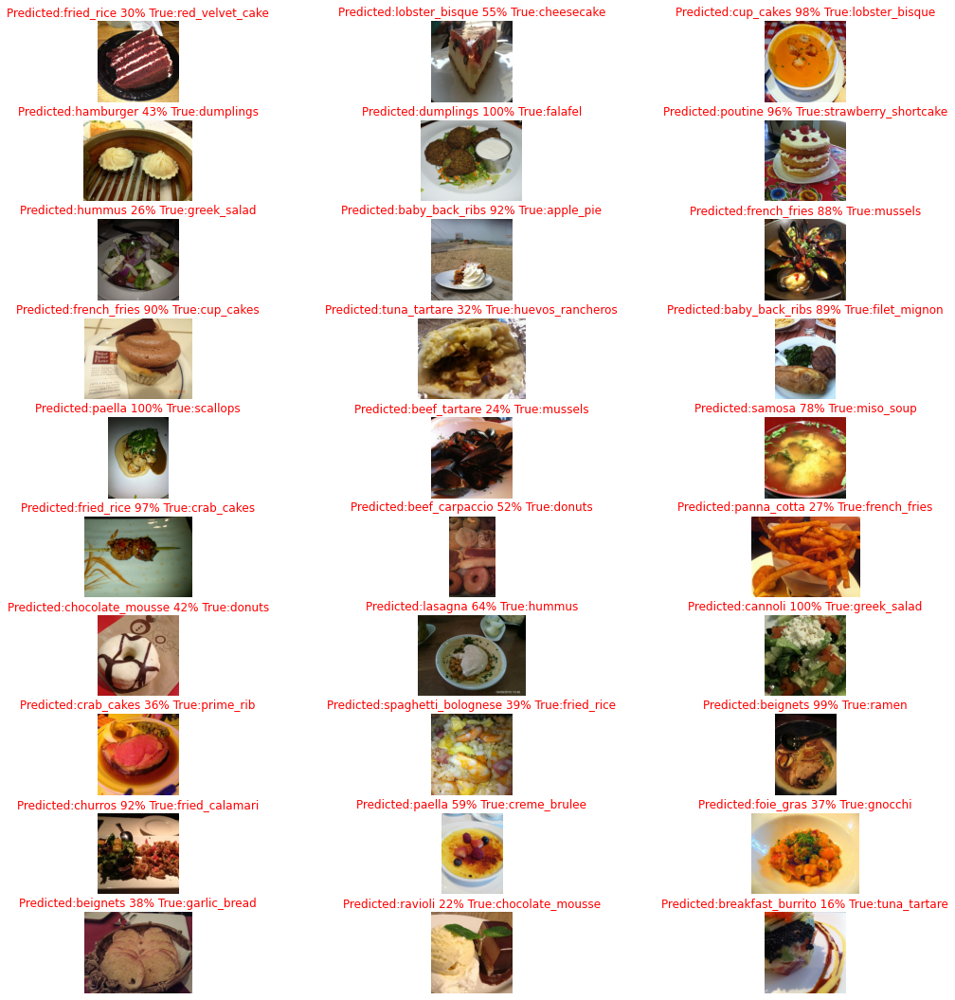

In [139]:
test_images, test_labels = get_imageLabel(test_data)
show_30_imageResults(predictions, test_images, test_labels, 10, 3)


In [133]:
%tensorboard --logdir /content/drive/MyDrive/notebooks

<IPython.core.display.Javascript object>

In [136]:
def plot_loss_curves(history):
  """ plotting the Validation & Training accuracy, loss results of a model"""

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  epochs = range(len(loss))

  # Plotting loss of a model val & train results
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='validation_loss')
  plt.title('Loss Score')
  plt.xlabel('Epochs')
  plt.legend()

  # Plotting accuracy of val & train results
  plt.figure()
  plt.plot(epochs, acc, label='training_accuracy')
  plt.plot(epochs, val_acc, label='validation_accuracy')
  plt.title('Accuracy Score')
  plt.xlabel('Epochs')
  plt.legend()

Plotting The model Training & Validation accuracy, loss repsectively. So that we see as a final results for the performance of that model.

We're plotting for each Epoch as x so each step we see how the model goes whether it improves or worsen a bit.



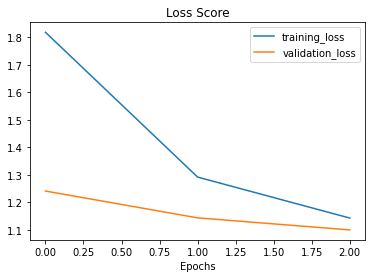

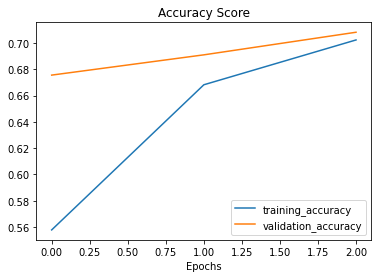

In [137]:
plot_loss_curves(history)

Awesome!, as we can see that the model are approaching accuracy same as validation which are great. 